# Data Preprocessing and Feature Engineering Steps

- This notebook will detail the chosen steps to preprocess the data and to engineer possible new features for the predictive modeling

- The insights on the data to decide on this steps were taken from the EDA.

In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from src.utils.transformers import RobustScaling, OutlierFlagger
from src.cv_train_model import cv_train_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import f1_score, roc_auc_score, accuracy_score, precision_score, average_precision_score, recall_score
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier

---
## 1. Outlier and Scale Handling

- As was seen in the EDA, several features showed outlier observations and very different scales. Those outliers can influence regular normalization/standardization of the data, since they can highly influence the mean and standard deviation. Moreover, some prediction models are sensitive to outliers, while others are less benefited, but dealing with outliers is an important preprocessing step nontheless.

- For this dataset, two strategies were thought of:
    - Creation of a binary feature that signals if the group of *ip* or *dm* features (mean, std, skew and kurtosis) is an outlier compared to its group. The detection of these outlier observations will be done with Isolation Forest models, as they have been proven to be one of the best outlier detection models currently.  

    - Standardization of the data based on a Robust scaler that uses the median and IQR.

- It was decided not to remove or truncate outliers, as this can be a "dangerous" practice that requires a lot of domain knowledge on the data.

In [2]:
# Read the data
df = pd.read_csv('data/pulsar_data.csv')

### 1.1 Outlier Flag with Isolation Forest:

In [3]:
# Create the flagger object for the ip features
flagger_ip_feats = OutlierFlagger(
    outlier_col_name='ip_outlier',
    columns=df.columns[:4]
)

# Create the flagger object for the dm features
flagger_dm_feats = OutlierFlagger(
    outlier_col_name='dm_outlier',
    columns=df.columns[4:8]
)

In [4]:
# Create the outlier flag columns
df = flagger_ip_feats.fit_transform(df)
df = flagger_dm_feats.fit_transform(df)

In [5]:
# Prints the value counts of detected outliers
print(df.ip_outlier.value_counts())
print(df.dm_outlier.value_counts())

ip_outlier
0    15760
1     2138
Name: count, dtype: int64
dm_outlier
0    14341
1     3557
Name: count, dtype: int64


#### Visualizing the Outlier Flag distribution in the ip Variables:

In [6]:
# Creates boxplots for the ip variables separated by the outlier flag
rows=1
cols=4
fig_hist_ip_outl = make_subplots(rows=rows, cols=cols, subplot_titles=df.columns[:4], horizontal_spacing=0.05, vertical_spacing=0.2)

df_out_0 = df[df['ip_outlier'] == 0]
df_out_1 = df[df['ip_outlier'] == 1]
df_tgt_0 = df[df['target'] == 0]
df_tgt_1 = df[df['target'] == 1]

for i, col in enumerate(df.columns[:4]):
    if i == len(df.columns[:4]) - 1:
        trace_out_0 = go.Histogram(x=df_out_0[col], name='Not Outlier', marker_color = 'navy', histnorm='probability density')
        trace_out_1 = go.Histogram(x=df_out_1[col], name='Outlier', marker_color = 'gold', histnorm='probability density')
        trace_tgt_0 = go.Histogram(x=df_tgt_0[col], name='Not Pulsar', marker_color = 'indianred', histnorm='probability density')
        trace_tgt_1 = go.Histogram(x=df_tgt_1[col], name='Pulsar', marker_color = 'lightseagreen', histnorm='probability density')
    else:
        trace_out_0 = go.Histogram(x=df_out_0[col], name='Not Outlier', marker_color = 'navy', histnorm='probability density', showlegend=False)
        trace_out_1 = go.Histogram(x=df_out_1[col], name='Outlier', marker_color = 'gold', histnorm='probability density', showlegend=False)
        trace_tgt_0 = go.Histogram(x=df_tgt_0[col], name='Not Pulsar', marker_color = 'indianred', histnorm='probability density', showlegend=False)
        trace_tgt_1 = go.Histogram(x=df_tgt_1[col], name='Pulsar', marker_color = 'lightseagreen', histnorm='probability density', showlegend=False)

    row_num = 1
    col_num = (i%cols) + 1
    
    fig_hist_ip_outl.add_trace(trace_out_0, row=row_num, col=col_num)
    fig_hist_ip_outl.add_trace(trace_out_1, row=row_num, col=col_num)
    fig_hist_ip_outl.add_trace(trace_tgt_0, row=row_num, col=col_num)
    fig_hist_ip_outl.add_trace(trace_tgt_1, row=row_num, col=col_num)

fig_hist_ip_outl.update_layout(
    height=400,
    width=1200,
    margin=dict(l=20,r=20,b=20,t=20,pad=4),
    barmode='overlay'
    )
fig_hist_ip_outl.update_traces(opacity=0.6)
fig_hist_ip_outl.show()

- It can be seen that the distribution of non outliers (purple) and non pulsars (red) are significantly overlapping eachother, showing how similar the two distributions are.

- The same goes for the outliers (yellow) and pulsars (green), although with a weaker overlap, and also weakly overlapping with the non outliers and non pulsars distributions.

- This plot shows that the outlier flag feature for the ip variables shows great predictive potential for the target variable.

#### Visualizing the Outlier Flag distribution in the dm Variables:

In [7]:
# Creates boxplots for the ip variables separated by the outlier flag
fig_hist_dm_outl = make_subplots(rows=rows, cols=cols, subplot_titles=df.columns[4:8], horizontal_spacing=0.05, vertical_spacing=0.2)

df_out_0 = df[df['dm_outlier'] == 0]
df_out_1 = df[df['dm_outlier'] == 1]

for i, col in enumerate(df.columns[4:8]):
    if i == len(df.columns[4:8]) - 1:
        trace_out_0 = go.Histogram(x=df_out_0[col], name='Not Outlier', marker_color = 'navy', histnorm='probability density')
        trace_out_1 = go.Histogram(x=df_out_1[col], name='Outlier', marker_color = 'gold', histnorm='probability density')
        trace_tgt_0 = go.Histogram(x=df_tgt_0[col], name='Not Pulsar', marker_color = 'indianred', histnorm='probability density')
        trace_tgt_1 = go.Histogram(x=df_tgt_1[col], name='Pulsar', marker_color = 'lightseagreen', histnorm='probability density')
    else:
        trace_out_0 = go.Histogram(x=df_out_0[col], name='Not Outlier', marker_color = 'navy', histnorm='probability density', showlegend=False)
        trace_out_1 = go.Histogram(x=df_out_1[col], name='Outlier', marker_color = 'gold', histnorm='probability density', showlegend=False)
        trace_tgt_0 = go.Histogram(x=df_tgt_0[col], name='Not Pulsar', marker_color = 'indianred', histnorm='probability density', showlegend=False)
        trace_tgt_1 = go.Histogram(x=df_tgt_1[col], name='Pulsar', marker_color = 'lightseagreen', histnorm='probability density', showlegend=False)

    row_num = 1
    col_num = (i%cols) + 1
    
    fig_hist_dm_outl.add_trace(trace_out_0, row=row_num, col=col_num)
    fig_hist_dm_outl.add_trace(trace_out_1, row=row_num, col=col_num)
    fig_hist_dm_outl.add_trace(trace_tgt_0, row=row_num, col=col_num)
    fig_hist_dm_outl.add_trace(trace_tgt_1, row=row_num, col=col_num)

fig_hist_dm_outl.update_layout(
    height=400,
    width=1200,
    margin=dict(l=20,r=20,b=20,t=20,pad=4),
    barmode='overlay'
    )
fig_hist_dm_outl.update_traces(opacity=0.6)
fig_hist_dm_outl.show()

- As for the dm variables, the same can be seen with the distribution of non outliers and non pulsars.

- However, for the outliers and pulsars, we see that most of the outlier distributions are bimodal, where one of its peaks is highly overlapped by the pulsars, while the other peak is either alone or slightly overlapped by the non pulsars.

- This plot shows that the outlier flag feature for the dm variables shows some predictive potential for the target variable, but does not seem to separate that well compared to the one for the ip variables.

### 1.2 Robust Scaling

- Many machine learning algorithms commonly require the standardization of datasets. This process typically involves two steps: first, subtracting the mean value from each data point, and second, scaling the data to have a variance of one. However, outliers within the dataset can sometimes have a detrimental impact on the calculated mean and variance, leading to less reliable results. In such instances, using the median and interquartile range as measures of central tendency and spread often yields more robust outcomes.

- Many machine learning algorithms perform better when the features are standardized. Standardization ensures that no single feature has undue influence on the algorithm's learning process, leading to more stable and accurate models.

- Optimization algorithms used in various models converge faster and more stably when data is standardized. This is particularly important for iterative algorithms like gradient descent in neural networks.

In [8]:
# Creates the standardizer object
robust_scaler = RobustScaling(
    columns=df.columns[:8]
)

In [9]:
df = robust_scaler.fit_transform(df)

In [10]:
df.head()

,mean_ip,std_ip,kurt_ip,skew_ip,mean_dm,std_dm,kurt_dm,skew_dm,target,ip_outlier,dm_outlier
0,0.974313,1.010306,-1.025961,-0.804725,0.112390,0.046396,-0.093058,-0.084547,0,0,0
1,-0.480585,1.380212,0.542500,-0.639401,-0.317573,-0.257396,0.435435,0.424816,0,0,0
2,-0.461171,-0.879573,0.224299,0.763605,0.090195,0.234680,-0.141766,-0.190636,0,0,0
3,0.828554,1.183156,-0.653601,-0.747924,0.237530,0.178544,-0.312309,-0.282427,0,0,0
4,-1.007467,-0.725699,0.846264,0.828394,-0.458296,-0.499801,1.185840,1.624386,0,0,0


In [11]:
# Plots two figures, one with the boxplots of all features and another with the histograms
rows, cols = (2,4)
fig_box = make_subplots(rows=rows, cols=cols, subplot_titles=df.columns, horizontal_spacing=0.05, vertical_spacing=0.2)

for i, col in enumerate(df.columns[:8]):
    trace = go.Box(y=df[col], name=col)
    row_num = (i//(cols)) + 1
    col_num = (i%cols) + 1
    fig_box.append_trace(trace, row=row_num, col=col_num)

fig_box.update_layout(
    height=300,
    width=800,
    margin=dict(l=20,r=20,b=20,t=20,pad=4),
    showlegend=False
    )
fig_box.show()

fig_hist = make_subplots(rows=rows, cols=cols, subplot_titles=df.columns, horizontal_spacing=0.05, vertical_spacing=0.2)

for i, col in enumerate(df.columns[:8]):
    trace = go.Histogram(x=df[col], name=col, histnorm='probability density')
    row_num = (i//(cols)) + 1
    col_num = (i%cols) + 1
    fig_hist.append_trace(trace, row=row_num, col=col_num)

fig_hist.update_layout(
    height=300,
    width=800,
    margin=dict(l=20,r=20,b=20,t=20,pad=4),
    showlegend=False
    )
fig_hist.show()

- We can see now that most of the data is centered at zero, which can benefit the model's capabilities of prediction.

---
## 3. Putting it all Together and Small Test

- Now we can combine all the preprocessing steps in one pipeline object, create the preprocessed data, cross validate and test the model.

- For dealing with the class imbalance, weights are being included in the observations using the class_weight parameter of the RandomForrestClassifier, which assigns a higher importance to the observations of the minoritary class.

In [12]:
# Restarts the dataframe
df = pd.read_csv('data/pulsar_data.csv')

In [13]:
# Creates the transformer objects and the pipeline
outlier_flagger_ip = OutlierFlagger(
    outlier_col_name='ip_outlier',
    columns=df.columns[:4],
    random_state=42
)

outlier_flagger_dm = OutlierFlagger(
    outlier_col_name='dm_outlier',
    columns=df.columns[4:8],
    random_state=42
)

robust_scaler = RobustScaling(
    columns=df.columns[:8]
)

pipe = Pipeline([
    ('outlier_flagger_ip', outlier_flagger_ip),
    ('outlier_flagger_dm', outlier_flagger_dm),
    ('robust_scaling', robust_scaler),
    ('rf', RandomForestClassifier(random_state=42, class_weight='balanced'))
    ])

In [14]:
# Splits the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(df.drop(columns='target'), df['target'], test_size=0.2, random_state=42)

# Cross-validates and trains pipeline
model, cv_results = cv_train_model(
    pipe,
    X_train,
    y_train,
    kfolds=3,
    thresholds=[0.15, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.60, 0.65, 0.70, 0.75, 0.8, 0.85, 0.9],
    model_file_name='rf_feat_preprocess_test.pkl',
    cv_scores_file_name='rf_feat_preprocess_test_cv_scores.csv',
    overwrite_current=False
)
    

Instantiating the data and model...

Starting the cross validation loops with different thresholds...

Cross-validating with threshold = 0.15...

Cross-validating with threshold = 0.25...

Cross-validating with threshold = 0.3...

Cross-validating with threshold = 0.35...

Cross-validating with threshold = 0.4...

Cross-validating with threshold = 0.45...

Cross-validating with threshold = 0.5...

Cross-validating with threshold = 0.55...

Cross-validating with threshold = 0.6...

Cross-validating with threshold = 0.65...

Cross-validating with threshold = 0.7...

Cross-validating with threshold = 0.75...

Cross-validating with threshold = 0.8...

Cross-validating with threshold = 0.85...

Cross-validating with threshold = 0.9...

Training the model with the full data...

Saving the model to a pickle file...

Saving the CV scores to a csv file...

The model has been trained and saved!

Returning the model and the CV scores...



In [15]:
cv_scores_grouped = cv_results.groupby('threshold').mean()
cv_scores_grouped

,fit_time,score_time,test_F1-score,test_Accuracy,test_Precision,test_Recall,test_AUC,test_Average Precision
threshold,,,,,,,,
0.15,8.376594,0.288687,0.846597,0.969898,0.797607,0.902124,0.970148,0.916557
0.25,10.699246,0.245070,0.871160,0.975974,0.860234,0.882396,0.970148,0.916557
0.30,9.410701,0.161510,0.877267,0.977581,0.884432,0.870256,0.970148,0.916557
0.35,10.601967,0.275939,0.880377,0.978419,0.898866,0.862667,0.970148,0.916557
0.40,9.885751,0.248144,0.880192,0.978628,0.909455,0.852803,0.970148,0.916557
0.45,10.903836,0.250986,0.884672,0.979606,0.922575,0.849769,0.970148,0.916557
0.50,10.215634,0.228283,0.881176,0.979187,0.928569,0.838388,0.970148,0.916557
0.55,9.626235,0.198597,0.879420,0.979047,0.935053,0.830042,0.970148,0.916557
0.60,9.594221,0.206239,0.874431,0.978419,0.941390,0.816385,0.970148,0.916557


In [16]:
# Calculate the predicted probabilities and the predicted classes for the optimal threshold
opt_threshold = cv_scores_grouped['test_F1-score'].idxmax()
y_pred_scores = model.predict_proba(X_test)[:, 1]
y_pred = (y_pred_scores > opt_threshold).astype(int)

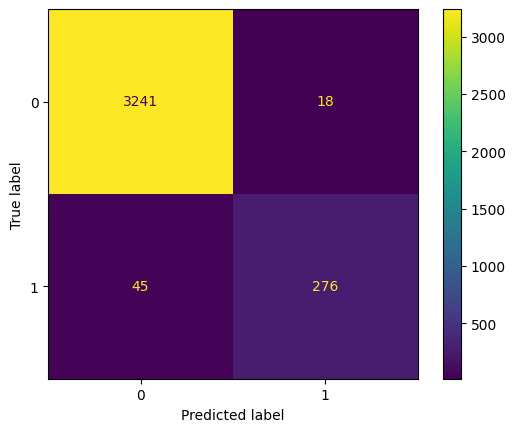

In [17]:
# Plot the confusion matrix with the optimal threshold value for the F1 score (0.45)
cm = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)
disp.plot()

In [18]:
# Prints the metrics for the test set
print(f'F1-score: {round(f1_score(y_test, y_pred), 4)}')
print(f'Accuracy: {round(accuracy_score(y_test, y_pred), 4)}')
print(f'Precision: {round(precision_score(y_test, y_pred), 4)}')
print(f'Recall: {round(recall_score(y_test, y_pred), 4)}')
print(f'AUC: {round(roc_auc_score(y_test, y_pred_scores), 4)}')
print(f'Average Precision: {round(average_precision_score(y_test, y_pred_scores), 4)}')

F1-score: 0.8976
Accuracy: 0.9824
Precision: 0.9388
Recall: 0.8598
AUC: 0.9702
Average Precision: 0.919


- When comparing the CV and test set results, we see that the results are very similar to the baseline model trained with the raw data.

- This can be due to the fact that Tree based models like random forests are robust to outliers and data scaling, which were the only two "problems" in the data, which also explains why the baseline model performs so well.

- The next step now is to perform hyperparameter tuning, to see if better results can be found.